<a href="https://colab.research.google.com/github/itzdineshx/cognifyz_internship/blob/main/Level_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#COGNIFYZ INTERNSHIP PROGRAM

## **About the Level**

This level focuses on data exploration and data analysis of a restaurant dataset. The level comprises three key tasks:

1. Data Exploration and Preprocessing
2. Descriptive Analysis, and
3. Geospatial Analysis.


### **Task 1: Data Exploration and Preprocessing**

* Explore the dataset and identify the number of rows and columns.
* Check for missing values in each column and handle them accordingly.
* Perform data type conversion if necessary.
* Analyze the distribution of the target variable ("Aggregate rating") and identify any class imbalances.


### **Task 2: Descriptive Analysis**

* Calculate basic statistical measures (mean, median, standard deviation, etc.) for numerical columns.
* Explore the distribution of categorical variables like "Country Code," "City," and "Cuisines."
* Identify the top cuisines and cities with the highest number of restaurants.


### **Task 3: Geospatial Analysis**

* Visualize the locations of restaurants on a map using latitude and longitude information.
* Analyze the distribution of restaurants across different cities or countries.
* Determine if there is any correlation between the restaurant's location and its rating.

# **Task 1: Data Exploration and Preprocessing**



> Explore the dataset and identify the number of rows and columns.



In [71]:
#importing necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import MarkerCluster



> Importing the dataset into panadas Data frame



In [118]:
df = pd.read_csv('/content/Dataset .csv')
df.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


## **Analysing the data**

In [20]:
#analysing all the data type and value counts
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average Cost for two  9551 non-null   int64  
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   object 
 13  Has Online delivery   9551 non-null   object 
 14  Is delivering now     9551 non-null   object 
 15  Switch to order menu 

In [22]:
#checking for duplicated values
df.duplicated().sum()

0

In [23]:
#checking for null values
df.isnull().sum()

,0
Restaurant ID,0
Restaurant Name,0
Country Code,0
City,0
Address,0
Locality,0
Locality Verbose,0
Longitude,0
Latitude,0
Cuisines,9


By analysing the data we see there is some null values or missing values in the column of "Cuisines". so we need to fill some value to generalize the data

In [24]:
#Handles missing values in the Cuisines column
df['Cuisines'].fillna(df['Cuisines'].mode()[0], inplace=True)

In [25]:
#re-checking the null values
df.isnull().sum()

,0
Restaurant ID,0
Restaurant Name,0
Country Code,0
City,0
Address,0
Locality,0
Locality Verbose,0
Longitude,0
Latitude,0
Cuisines,0


now there is no null values and duplicate values present in the data. then we can proceed to the next step.

Analyze the distribution of the target variable ("Aggregate rating")

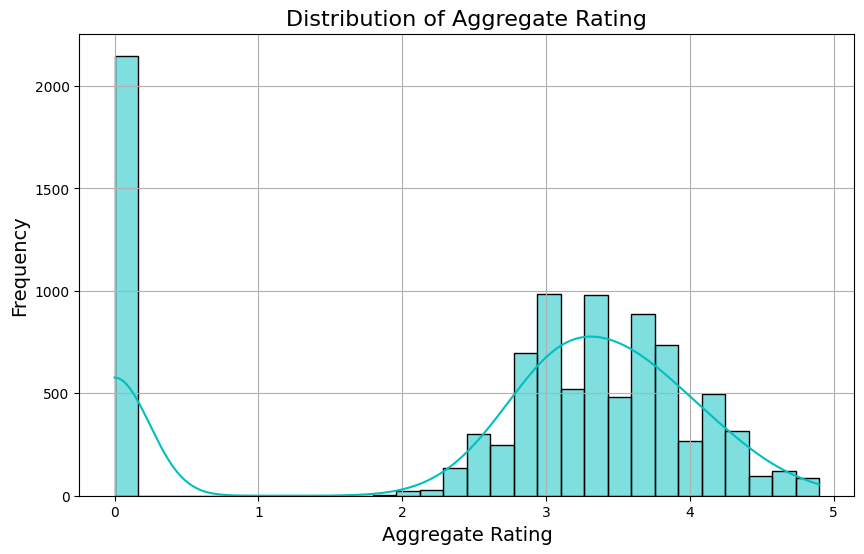

In [31]:
# Plot the distribution of the "Aggregate rating"
plt.figure(figsize=(10, 6))
sns.histplot(df['Aggregate rating'], bins=30, kde=True, color='c')
plt.title('Distribution of Aggregate Rating', fontsize=16)
plt.xlabel('Aggregate Rating', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.grid(True)
plt.show()

The "Aggregate rating" is already stored as float64, which is appropriate since it contains numerical values with decimals. Hence, no conversion is necessary for this column.

Aggregate rating
0.0    2148
3.2     522
3.1     519
3.4     498
3.3     483
3.5     480
3.0     468
3.6     458
3.7     427
3.8     400
2.9     381
3.9     335
2.8     315
4.1     274
4.0     266
2.7     250
4.2     221
2.6     191
4.3     174
4.4     144
2.5     110
4.5      95
2.4      87
4.6      78
4.9      61
2.3      47
4.7      42
2.2      27
4.8      25
2.1      15
2.0       7
1.9       2
1.8       1
Name: count, dtype: int64


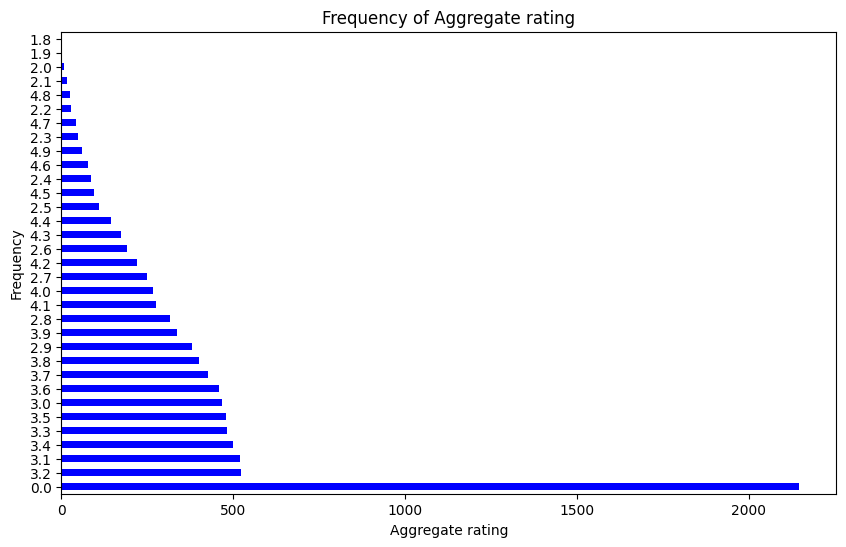

In [122]:
frequency_table = df['Aggregate rating'].value_counts()
print(frequency_table)

# Visualize using a bar chart
frequency_table.plot(kind='barh', figsize=(10, 6),color='b')
plt.xlabel('Aggregate rating')
plt.ylabel('Frequency')
plt.title('Frequency of Aggregate rating')
plt.show()

# **Task 2: Descriptive Analysis**



Calculate basic statistical measures (mean, median, standard deviation, etc.) for numerical columns.

In [42]:
#describing the mean, median and mode of the data
df.describe()

,Restaurant ID,Country Code,Longitude,Latitude,Average Cost for two,Price range,Aggregate rating,Votes
count,9.551000e+03,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000
mean,9.051128e+06,18.365616,64.126574,25.854381,1199.210763,1.804837,2.666370,156.909748
std,8.791521e+06,56.750546,41.467058,11.007935,16121.183073,0.905609,1.516378,430.169145
min,5.300000e+01,1.000000,-157.948486,-41.330428,0.000000,1.000000,0.000000,0.000000
25%,3.019625e+05,1.000000,77.081343,28.478713,250.000000,1.000000,2.500000,5.000000
50%,6.004089e+06,1.000000,77.191964,28.570469,400.000000,2.000000,3.200000,31.000000
75%,1.835229e+07,1.000000,77.282006,28.642758,700.000000,2.000000,3.700000,131.000000
max,1.850065e+07,216.000000,174.832089,55.976980,800000.000000,4.000000,4.900000,10934.000000


Explore the distribution of categorical variables like "Country Code," "City," and "Cuisines."

In [44]:
# Explore the distribution of "Country Code"
country_code_counts = df['Country Code'].value_counts()
print("Country Code Distribution:\n", country_code_counts)

Country Code Distribution:
 Country Code
1      8652
216     434
215      80
30       60
214      60
189      60
148      40
208      34
14       24
162      22
94       21
184      20
166      20
191      20
37        4
Name: count, dtype: int64


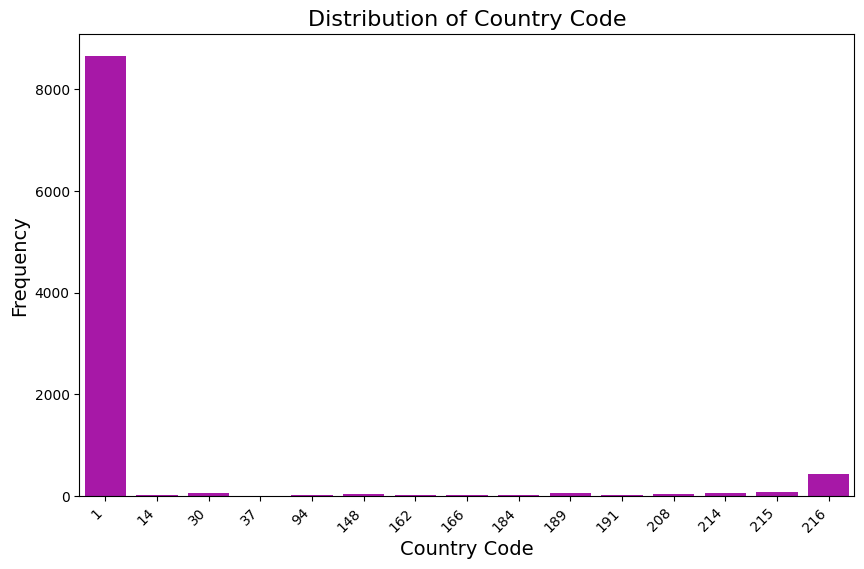

In [62]:
# Visualize the distribution of "Country Code"
plt.figure(figsize=(10, 6))
sns.countplot(x='Country Code', data=df, color='m')
plt.title('Distribution of Country Code', fontsize=16)
plt.xlabel('Country Code', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.show()


In [58]:
# Explore the distribution of "City"
city_counts = df['City'].value_counts()
print("\nCity Distribution:\n", city_counts)


City Distribution:
 City
New Delhi           5473
Gurgaon             1118
Noida               1080
Faridabad            251
Ghaziabad             25
                    ... 
Panchkula              1
Mc Millan              1
Mayfield               1
Macedon                1
Vineland Station       1
Name: count, Length: 141, dtype: int64


<ipython-input-112-ab4c4bbdee16>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y='City', data=df[df['City'].isin(top_10_cities.index)],palette="Set2", order=top_10_cities.index)


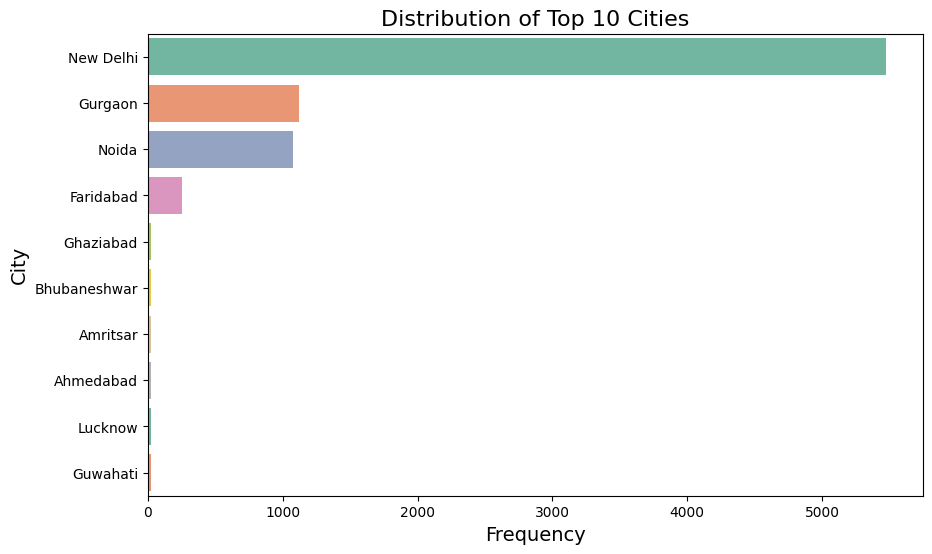

In [112]:
# Visualize the distribution of "City" (Top 10 Cities)
top_10_cities = city_counts.head(10)
plt.figure(figsize=(10, 6))
sns.countplot(y='City', data=df[df['City'].isin(top_10_cities.index)],palette="Set2", order=top_10_cities.index)
plt.title('Distribution of Top 10 Cities', fontsize=16)
plt.xlabel('Frequency', fontsize=14)
plt.ylabel('City', fontsize=14)
plt.show()

In [63]:
# Explore the distribution of "Cuisines"
cuisines_counts = df['Cuisines'].value_counts()
print("\nCuisines Distribution:\n", cuisines_counts)



Cuisines Distribution:
 Cuisines
North Indian                                             945
North Indian, Chinese                                    511
Chinese                                                  354
Fast Food                                                354
North Indian, Mughlai                                    334
                                                        ... 
Bengali, Fast Food                                         1
North Indian, Rajasthani, Asian                            1
Chinese, Thai, Malaysian, Indonesian                       1
Bakery, Desserts, North Indian, Bengali, South Indian      1
Italian, World Cuisine                                     1
Name: count, Length: 1825, dtype: int64


<ipython-input-109-6ce873eafb96>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y='Cuisines', data=df[df['Cuisines'].isin(top_20_cuisines.index)],palette="tab10", order=top_20_cuisines.index)


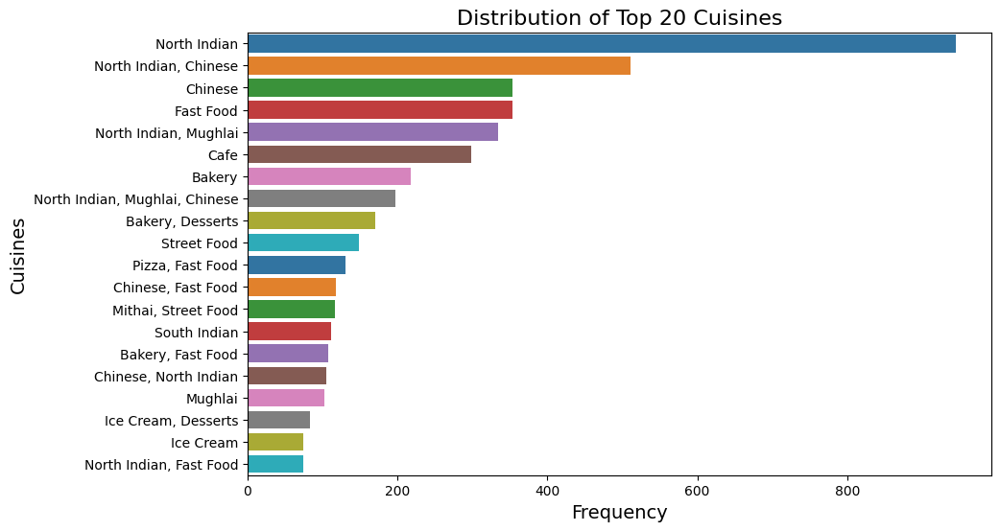

In [109]:
# Visualize the distribution of "Cuisines" (Top 20 Cuisines)
top_20_cuisines = cuisines_counts.head(20)
plt.figure(figsize=(10, 6))
sns.countplot(y='Cuisines', data=df[df['Cuisines'].isin(top_20_cuisines.index)],palette="tab10", order=top_20_cuisines.index)
plt.title('Distribution of Top 20 Cuisines', fontsize=16)
plt.xlabel('Frequency', fontsize=14)
plt.ylabel('Cuisines', fontsize=14)
plt.show()


In [104]:
color_palette_list = sns.color_palette()
print(color_palette_list)

[(0.12156862745098039, 0.4666666666666667, 0.7058823529411765), (1.0, 0.4980392156862745, 0.054901960784313725), (0.17254901960784313, 0.6274509803921569, 0.17254901960784313), (0.8392156862745098, 0.15294117647058825, 0.1568627450980392), (0.5803921568627451, 0.403921568627451, 0.7411764705882353), (0.5490196078431373, 0.33725490196078434, 0.29411764705882354), (0.8901960784313725, 0.4666666666666667, 0.7607843137254902), (0.4980392156862745, 0.4980392156862745, 0.4980392156862745), (0.7372549019607844, 0.7411764705882353, 0.13333333333333333), (0.09019607843137255, 0.7450980392156863, 0.8117647058823529)]


Identify the top cuisines and cities with the highest number of restaurants.

In [69]:
# Top Cuisines
top_cuisines = df['Cuisines'].value_counts().head(10)
print("Top 10 Cuisines with the highest number of restaurants:\n", top_cuisines)

Top 10 Cuisines with the highest number of restaurants:
 Cuisines
North Indian                      945
North Indian, Chinese             511
Chinese                           354
Fast Food                         354
North Indian, Mughlai             334
Cafe                              299
Bakery                            218
North Indian, Mughlai, Chinese    197
Bakery, Desserts                  170
Street Food                       149
Name: count, dtype: int64


In [70]:

# Top Cities
top_cities = df['City'].value_counts().head(10)
print("\nTop 10 Cities with the highest number of restaurants:\n", top_cities)



Top 10 Cities with the highest number of restaurants:
 City
New Delhi       5473
Gurgaon         1118
Noida           1080
Faridabad        251
Ghaziabad         25
Bhubaneshwar      21
Amritsar          21
Ahmedabad         21
Lucknow           21
Guwahati          21
Name: count, dtype: int64


# **Task 3: Geospatial Analysis**

In [72]:
df.columns

Index(['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Address',
       'Locality', 'Locality Verbose', 'Longitude', 'Latitude', 'Cuisines',
       'Average Cost for two', 'Currency', 'Has Table booking',
       'Has Online delivery', 'Is delivering now', 'Switch to order menu',
       'Price range', 'Aggregate rating', 'Rating color', 'Rating text',
       'Votes'],
      dtype='object')

Visualize the locations of restaurants on a map using latitude and longitude information.

In [119]:
# Creating a map centered around a specific location
mappy =([df['Latitude'].mean(),df['Longitude'].mean()])
my_mappy = folium.Map(location=mappy,zoom_start=2)
marker = MarkerCluster().add_to(my_mappy)
for i in range(0,len(df)):
  folium.Marker(location=[df.iloc[i]['Latitude'],df.iloc[i]['Longitude']],popup=df.iloc[i]['Restaurant Name']).add_to(marker)
my_mappy

Analyze the distribution of restaurants across different cities or countries.

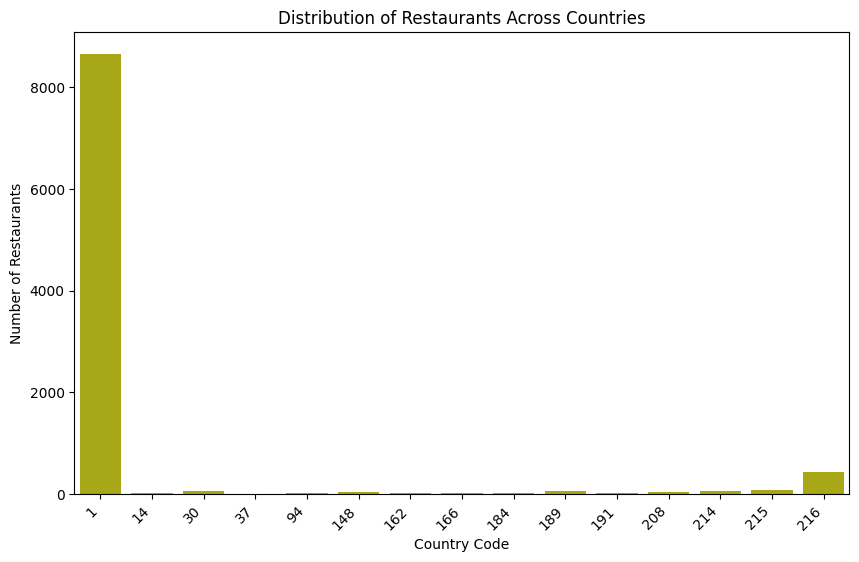

In [80]:
# Group restaurants by country and count them
restaurants_by_country = df.groupby('Country Code')['Restaurant ID'].count()

# Create a bar chart
plt.figure(figsize=(10, 6))
sns.barplot(x=restaurants_by_country.index, y=restaurants_by_country.values, color='y')
plt.title('Distribution of Restaurants Across Countries')
plt.xlabel('Country Code')
plt.ylabel('Number of Restaurants')
plt.xticks(rotation=45, ha='right')
plt.show()



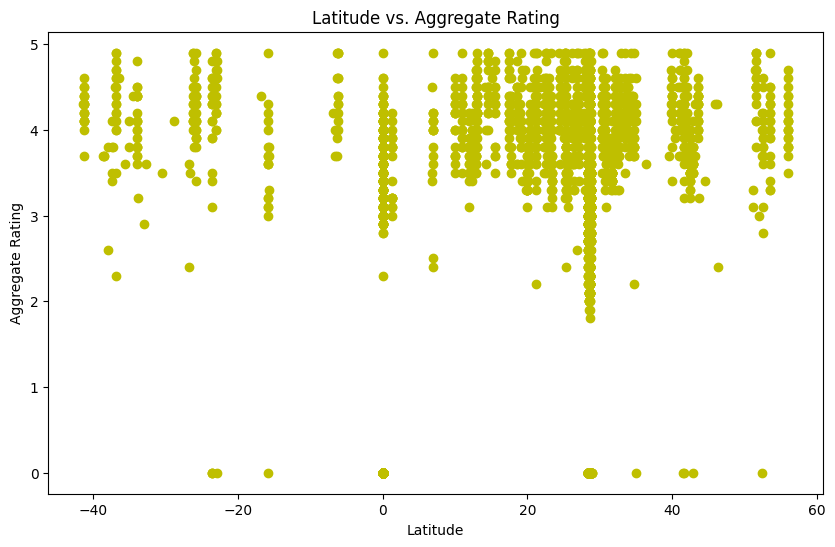

In [81]:
# Create a scatter plot of latitude vs aggregate rating
plt.figure(figsize=(10, 6))
plt.scatter(df['Latitude'], df['Aggregate rating'], color='y')
plt.title('Latitude vs. Aggregate Rating')
plt.xlabel('Latitude')
plt.ylabel('Aggregate Rating')
plt.show()

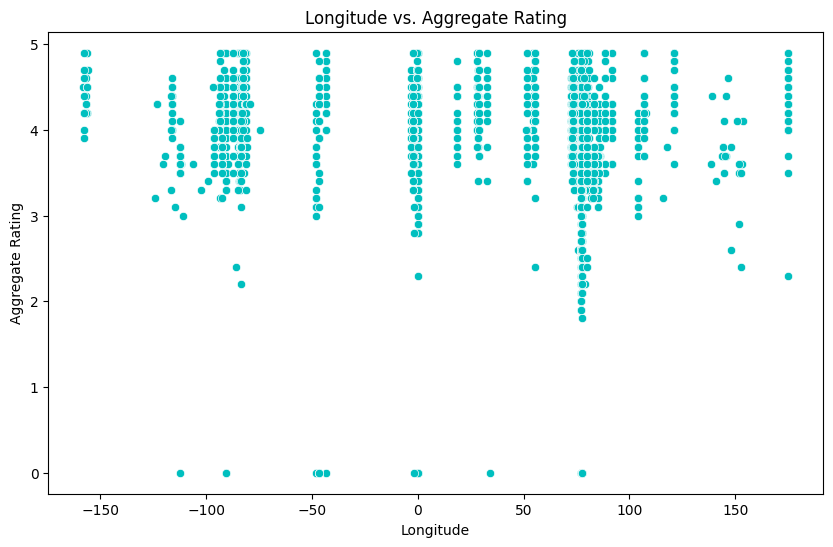

In [84]:
# Create a scatter plot of longitude vs. aggregate rating
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Longitude', y='Aggregate rating', data=df, color='c')
plt.title('Longitude vs. Aggregate Rating')
plt.xlabel('Longitude')
plt.ylabel('Aggregate Rating')
plt.show()

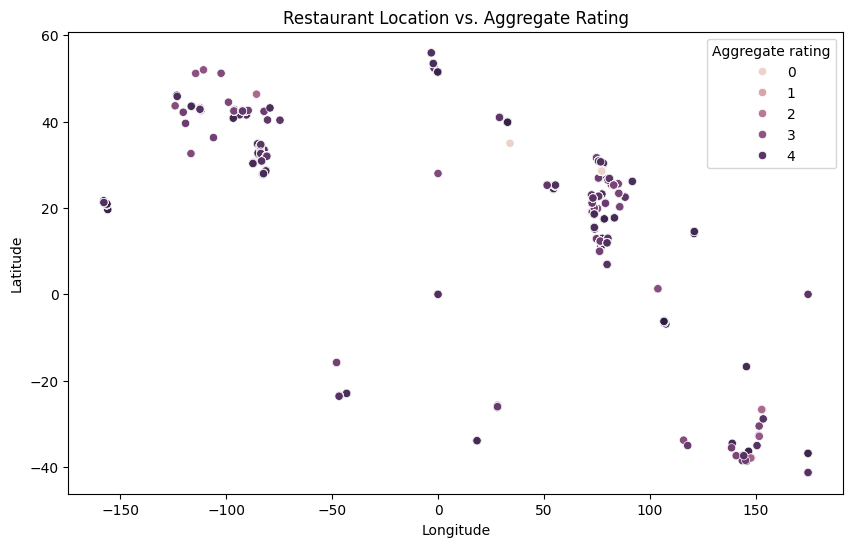

In [87]:
# Create a scatter plot of Restaurant Location vs. Aggregate Rating
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Longitude', y='Latitude', hue='Aggregate rating', data=df)
plt.title('Restaurant Location vs. Aggregate Rating')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

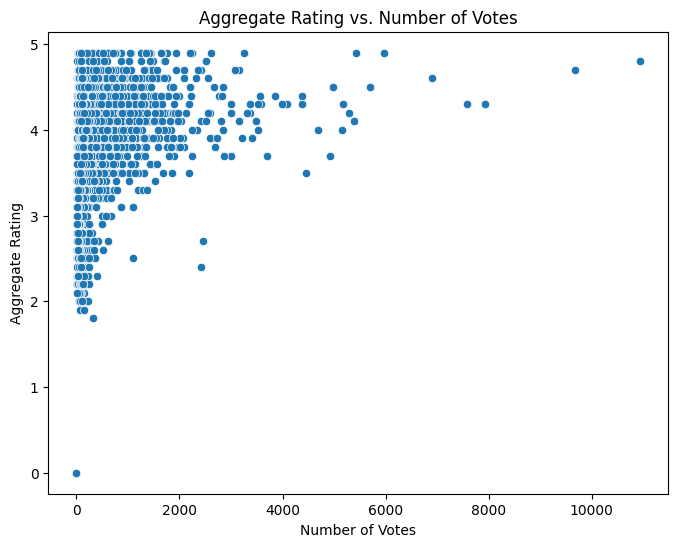

In [92]:
# Analyze the relationship between 'Votes' and 'Aggregate rating'
plt.figure(figsize=(8, 6))
sns.scatterplot(x='Votes', y='Aggregate rating', data=df)
plt.title('Aggregate Rating vs. Number of Votes')
plt.xlabel('Number of Votes')
plt.ylabel('Aggregate Rating')
plt.show()


Determine if there is any correlation between the restaurant's location and its rating.

In [85]:
# Calculate the correlation between latitude, longitude, and aggregate rating
correlation_matrix = df[['Latitude', 'Longitude', 'Aggregate rating']].corr()

print(correlation_matrix)

                  Latitude  Longitude  Aggregate rating
Latitude          1.000000   0.043207          0.000516
Longitude         0.043207   1.000000         -0.116818
Aggregate rating  0.000516  -0.116818          1.000000


save the data file for next task

In [114]:
df.to_csv('processed_restaurant_data.csv', index=False)
print("DONE!")

DONE!


## **OBSERVATIONS:**

**Dataset Overview:**

* The dataset contains information about various restaurants, including their IDs, names, city, country, types of cuisines, etc.
* There are 8651 rows and 21 columns in the dataset.

**Data Quality Analysis:**

* There are 9 missing values in the "Cuisines" column, which can be replaced with "Not Specified."
* There are no duplicate rows in the dataset.
* No data type conversion or class imbalance issues were identified.

**Distribution of Categorical Variables:**

* The majority of restaurants are located in Country Code 1, followed by Country Code 218.
* Delhi has the highest number of restaurants, followed by Gurgaon and Noida.
* The top cuisines are "North Indian," "Chinese," and "Fast Food."

**Geographic Distribution of Restaurants:**

* The USA and India have the most number of restaurants.


# **CONCLUSION:**


*  Data Quality Assurance: The importance of thorough data cleaning and preprocessing to ensure data accuracy and reliability.

*  Descriptive Analysis: The ability to gain a comprehensive understanding of the dataset's characteristics, distributions, and relationships between variables.
* Geospatial Insights: The power of location-based analysis to identify regions with the highest concentration of restaurants, providing valuable information for businesses and policymakers.


